<a href="https://colab.research.google.com/github/PhaninderVaka/Analysis_on_Hybrid_Ramjet/blob/main/Hybrid_ramjet_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hybrid Ramjet Propulsion System Analysis
## Overview
* The objective of this notebook is to perform a chemical equilibrium analysis for a hybrid ramjet propulsion system. The analysis will involve calculating various performance parameters, such as specific impulse (Isp), combustion temperature (Tc), and mass fraction (MF), for different oxidizer-to-fuel mixture ratios (MR) and chamber pressures (Pc). The analysis will be conducted using the "rocketcea" library, along with other Python libraries for data analysis and visualization.


## Libraries Used
The following Python libraries will be utilized in this analysis:

* numpy: For numerical operations and array manipulation.
* pandas:
  For working with data in tabular form using DataFrames.
* matplotlib: For creating static plots and visualizations.
* seaborn: For setting plot styles and accessing color palettes.
* rocketcea: For chemical equilibrium analysis and propellant properties.
* bokeh: A Python library for creating interactive and web-based data visualizations.

## Oxidizer and Fuel Cards:
* The chemical composition and thermodynamic properties of the oxidizer and fuel will be defined using the "rocketcea.cea_obj" module. The oxidizer and fuel cards will include properties such as composition, enthalpy, and temperature.

## Performance Parameters
The main focus of the analysis will be on calculating key performance parameters for the hybrid ramjet system. These parameters include:

* Specific Impulse (Isp): A measure of propellant efficiency, representing the thrust produced per unit mass flow rate of propellant.
* Combustion Temperature (Tc): The temperature at which the combustion process occurs in the ramjet engine.
* Mass Fraction (MF): The average molecular weight of the combustion products.

The performance parameters will be calculated for various mixture ratios (MR), hybrid ratios(H_o_f) and chamber pressures (Pc).

## Plotting
The calculated results will be visualized using line plots and graphs. The following visualizations will be generated:

* Temperature vs. Mixture Ratio: A line plot showing the variation of combustion temperature with different mixture ratios at a constant chamber pressure.
* Mass Flow Rate vs. Mixture Ratio: A line plot depicting the change in mass flow rate of air with different mixture ratios for various hybrid ratios.
* Several other parameters also plotted for a range of Mixture and Hybrid ratios.


## Interactive Plots:
* The use of Bokeh for interactive visualization, enabling users to hide/show specific lines in the plots by clicking on the legend items.

## CSV Saving
* The calculated results will be saved to CSV files, allowing for further analysis, data sharing, and presentation of the findings.

## Some terminologies
* Hybrid ratios: ratio of oxygen to paraffin wax.
* Mixture ratios: ratio of air to fuel(combustion product of hybrid).


Install RocketCEA for Chemical Equilibrium Analysis

In [1]:
! pip install rocketcea

Import the necessary libraries

In [2]:
import numpy as np
import math
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.widgets import Cursor
import seaborn as sns
from pylab import *
import rocketcea

## Starting with RocketCEA

Define fuel and oxidizer, get the cea output for a given mixer ratio

In [ ]:
# Import fuel and oxidizer card
from rocketcea.cea_obj import CEA_Obj, add_new_fuel, add_new_oxidizer, add_new_propellant

# Add oxidizer
card_str = """
   oxid Air    wt%=100.00
   h,cal=-28.2     t(k)=300

   """
add_new_oxidizer( 'oxy', card_str )

# Add fuel
card_str = """
   fuel OXYGEN  O 2 wt%=81.82
   h,cal= 12.9918 t(k)=300
   fuel WAX C 26 H 54 wt%=18.18
   h,cal= -140439.7 t(k)=300

   """
add_new_fuel( 'fuel', card_str )

# Assign oxidizer and fuel name to cea_obj to process above two cards
C = CEA_Obj(oxName='oxy', fuelName="fuel")

# Get full cea output in SI units for a given mixture ratio and Chamber pressure
s = C.get_full_cea_output( Pc=10, MR=[MR for MR in range(20, 41)], frozen = 0, pc_units='bar',output='siunits')

print( s )

Plot Temperature vs Mixture Ratio for a Chamber pressure of 10 bar

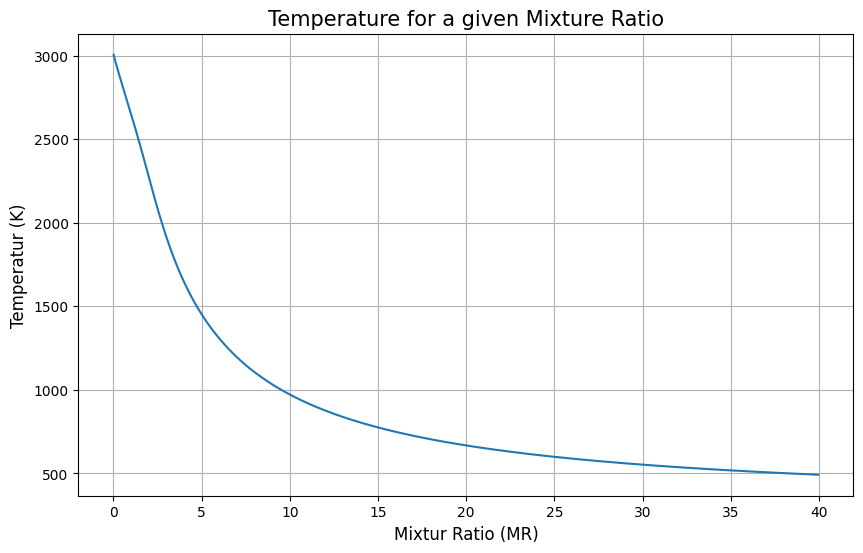

In [4]:
T_c = []    # empty combustion temperature list
MR_lst = [] # empty mixture ratio list
MR = 0.01
while MR < 40:
  temperature = C.get_Tcomb(Pc=10, MR = MR)   # getting combustion temperature from rocketcea
  T_c.append(temperature * 5/9)
  MR_lst.append(MR)
  MR += 0.05
plt.figure(figsize = (10,6))  # figure size
sns.lineplot(x = MR_lst, y = T_c) # lineplot using seaborn
plt.title('Temperature for a given Mixture Ratio', fontsize = 15)
plt.xlabel('Mixtur Ratio (MR)', fontsize = 12)
plt.ylabel('Temperatur (K)', fontsize =12)
plt.grid()


Generating CEA output for various Hybrid and Mixture ratios

In [ ]:
# Import fuel and oxidizer card
from rocketcea.cea_obj import CEA_Obj, add_new_fuel, add_new_oxidizer, add_new_propellant

# Add oxidizer
card_str = """
   oxid Air    wt%=100.00
   h,cal=-28.2     t(k)=300

   """
add_new_oxidizer( 'oxy', card_str )

# Add fuel
lst1 = [84, 85, 86, 89, 92]
lst2 = [16, 15, 14, 11, 8]
for i in range(len(lst1)):
  card_str = """
   fuel OXYGEN  O 2     wt%=""" + str(lst1[i]) + """
   h,cal= 12.9918 t(k)=300
   fuel WAX C 26 H 54    wt%=""" + str(lst2[i]) + """
   h,cal= -140439.7 t(k)=300

   """
  add_new_fuel( 'fuel', card_str )

  # Assign oxidizer and fuel name to cea_obj to process above two cards
  C = CEA_Obj(oxName='oxy', fuelName="fuel")

  # Get full cea output in SI units for a given mixture ratio and Chamber pressure
  s = C.get_full_cea_output( Pc=1, MR=[MR for MR in range(20, 41)], frozen = 0, pc_units='bar',output='siunits')

  print( s )

Single Plot for the teperature at each hybrid and various mixture ratios

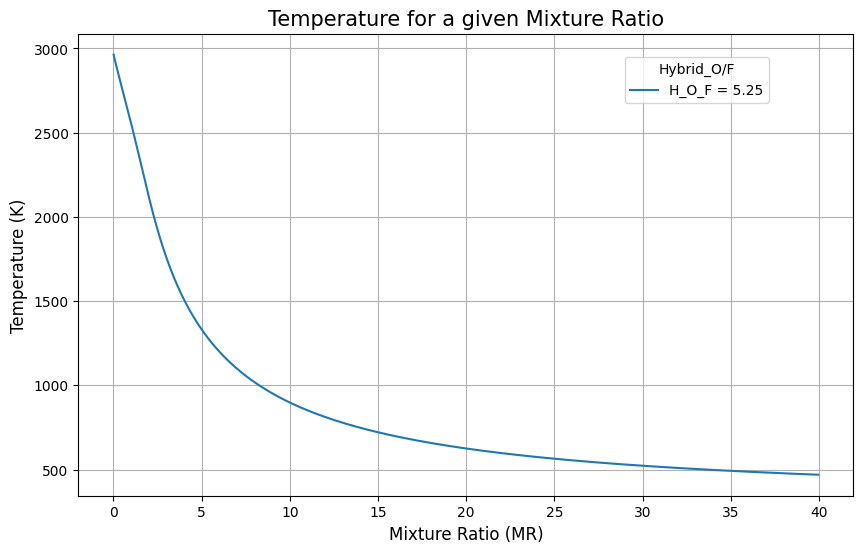

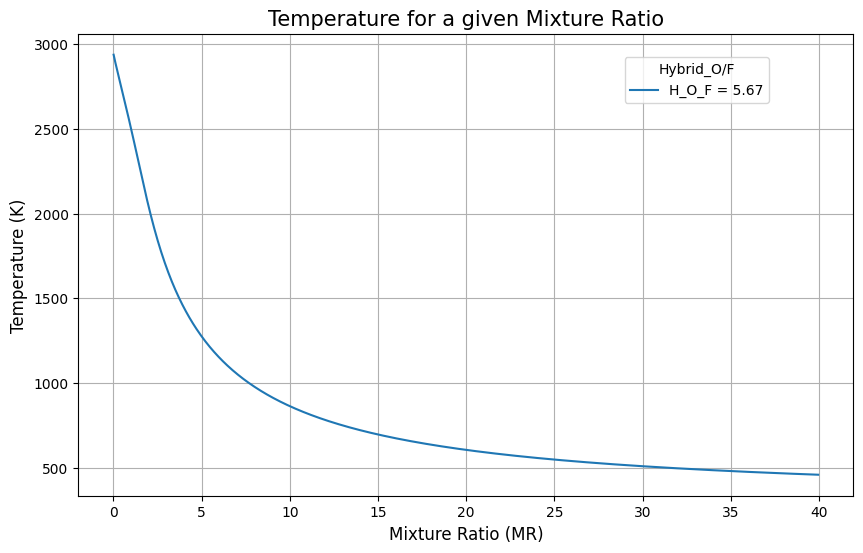

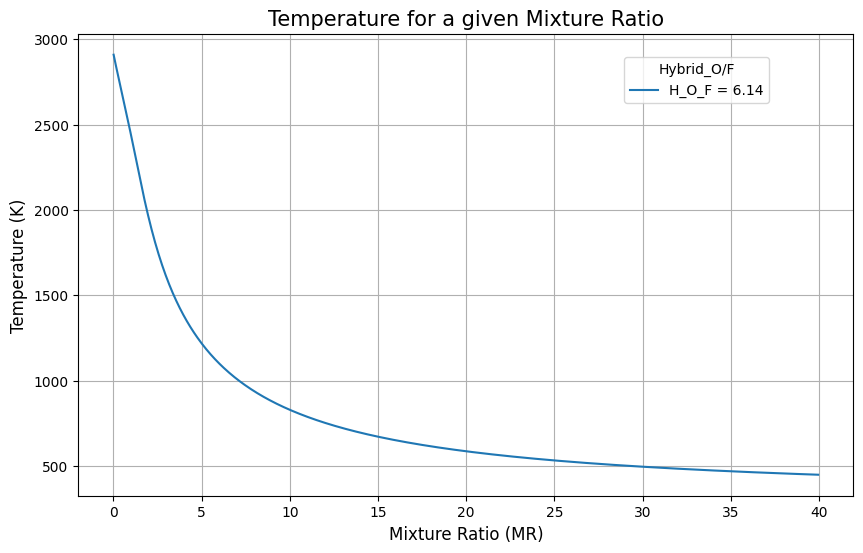

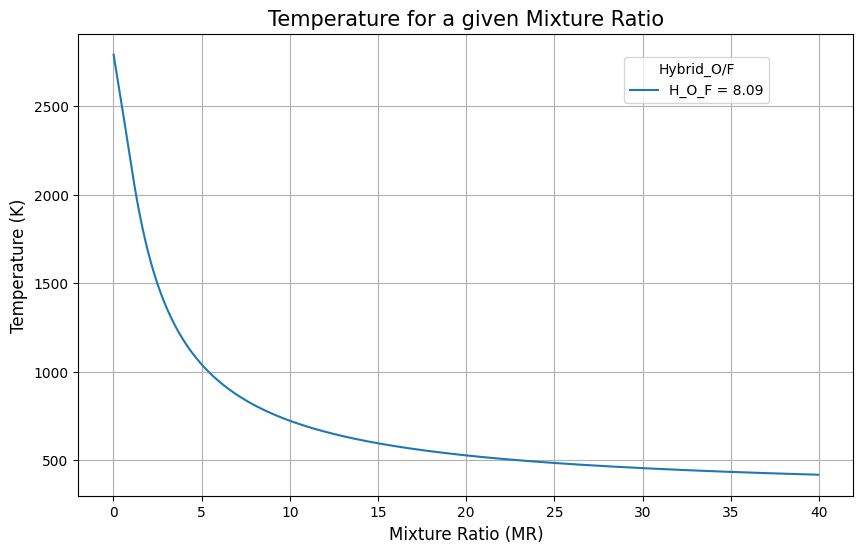

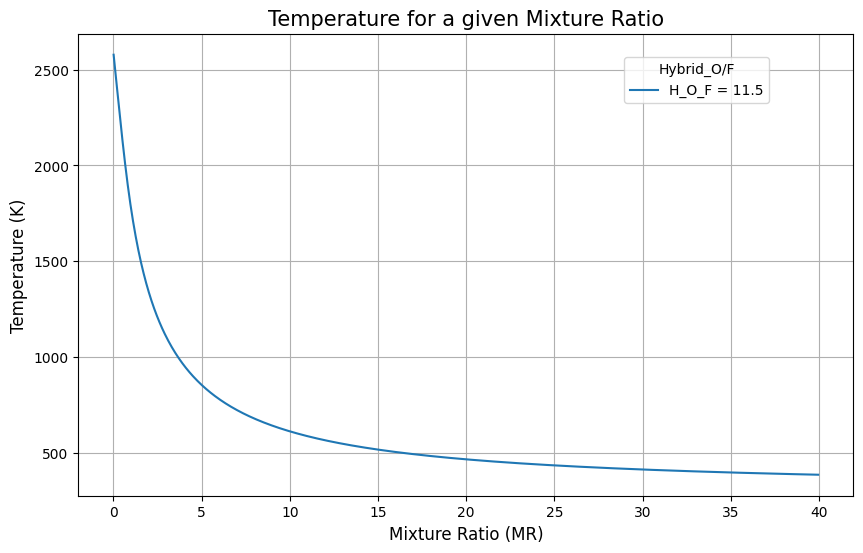

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from rocketcea.cea_obj import CEA_Obj, add_new_fuel, add_new_oxidizer, add_new_propellant

# Add oxidizer
card_str = """
   oxid Air    wt%=100.00
   h,cal=-28.2     t(k)=300

   """
add_new_oxidizer('oxy', card_str)

H_O_F = []
# Add fuel
lst1 = [84, 85, 86, 89, 92]
lst2 = [16, 15, 14, 11, 8]
for i in range(len(lst1)):
    card_str = """
       fuel OXYGEN  O 2     wt%=""" + str(lst1[i]) + """
       h,cal= 12.9918 t(k)=300
       fuel WAX C 26 H 54    wt%=""" + str(lst2[i]) + """
       h,cal= -140439.7 t(k)=300

       """
    add_new_fuel('fuel', card_str)

    # Assign oxidizer and fuel name to cea_obj to process above two cards
    C = CEA_Obj(oxName='oxy', fuelName="fuel")

    # Get full cea output in SI units for a given mixture ratio and Chamber pressure
    s = C.get_full_cea_output(Pc=1, MR=[MR for MR in range(20, 41)], frozen=0, pc_units='bar', output='siunits')
    H_O_F.append(round(lst1[i] / lst2[i], 2))
    T_c = []
    MR_lst = []
    MR = 0.01
    while MR < 40:
        temperature = C.get_Tcomb(Pc=10, MR=MR)
        T_c.append(temperature * 5 / 9)
        MR_lst.append(MR)
        MR += 0.05
    plt.figure(figsize=(10, 6))
    sns.lineplot(x=MR_lst, y=T_c, label=f'H_O_F = {H_O_F[i]}')
    plt.title('Temperature for a given Mixture Ratio', fontsize=15)
    plt.xlabel('Mixture Ratio (MR)', fontsize=12)
    plt.ylabel('Temperature (K)', fontsize=12)
    plt.legend(title="Hybrid_O/F", bbox_to_anchor=(0.9, 0.9), loc='right')
    plt.grid()

plt.show()


## Combustion temperature for Mixture of hybrid and air

Check temperature at various hybrid ratios

In [7]:
# Import fuel and oxidizer card
from rocketcea.cea_obj import CEA_Obj, add_new_fuel, add_new_oxidizer, add_new_propellant

# Add oxidizer
card_str = """
   oxid Air    wt%=100.00
   h,cal=-28.2     t(k)=300

   """
add_new_oxidizer( 'oxy', card_str )

# Add fuel
T_C = []
lst1 = []
lst2 = []
O_F = []


# Iterating for a range of oxidizer to fuel mixture (these are hybrid ratios)
for o_f in np.linspace(1, 5, 20):
  m_f = 100 / (1 + o_f)
  m_ox = 100 - m_f
  lst1.append(m_ox)
  lst2.append(m_f)
  O_F.append(round(o_f, 2))

# Iterating fuel card for several Hybrid ratios
for i in range(len(lst1)):
  card_str = """
   fuel OXYGEN  O 2     wt%=""" + str(lst1[i]) + """
   h,cal= 12.9918 t(k)=300
   fuel WAX C 26 H 54    wt%=""" + str(lst2[i]) + """
   h,cal= -140439.7 t(k)=300

   """
  add_new_fuel( 'fuel', card_str )

  # Assign oxidizer and fuel name to cea_obj to process above two cards
  C = CEA_Obj(oxName='oxy', fuelName="fuel")

  # Get full cea output in SI units for a given mixture ratio and Chamber pressure
  #s = C.get_full_cea_output( Pc=1, MR=[MR for MR in range(20, 41)], frozen = 0, pc_units='bar',output='siunits')


  MR = 0.01
  T_c = []
  MR_lst = []
  while MR < 40:
    temperature = C.get_Tcomb(Pc=10, MR = MR)
    T_c.append(temperature * 5/9)
    MR_lst.append(MR)
    MR += 0.05
  T_C.append(T_c)
print(T_C)
# print(O_F)
# print(MR_lst)


[[1506.5028225660526, 1512.5591193733542, 1518.4628380781278, 1524.1462061130874, 1529.6076779475566, 1534.8546656166936, 1554.4922911121437, 1595.5388393245198, 1634.6548865416848, 1671.9185103466125, 1707.4602962480635, 1741.39884927219, 1773.8402531414818, 1804.8794106404418, 1834.6020251983912, 1863.0859867987924, 1890.4025297508988, 1916.6169018841824, 1941.7899621118438, 1965.9777374701819, 1989.232402724218, 2011.6024871155798, 2033.1337978391562, 2053.868852084515, 2073.847609127456, 2093.107552635759, 2111.6838594283204, 2129.609546564356, 2146.915560381287, 2163.631051097978, 2179.7832439079057, 2195.3976852343953, 2210.498104244637, 2225.1072115669126, 2239.2457383371607, 2252.9331657931584, 2266.187629378621, 2279.0259775416384, 2291.4638264067817, 2303.515609776235, 2315.1946316173658, 2326.513026966404, 2337.4821082474236, 2348.111969253337, 2358.411681807025, 2368.3897350257334, 2378.053399901999, 2387.409194154139, 2396.4628166455623, 2405.219185345921, 2413.68240947274

Transpose the temperature cells and build the DataFrame

In [8]:
df_t = np.transpose(T_C)
df = pd.DataFrame(data = df_t, index = MR_lst, columns = O_F)
df = df.rename_axis(index='MR', columns="Hybrid_O/F")
df

Hybrid_O/F,1.00,1.21,1.42,1.63,1.84,2.05,2.26,2.47,2.68,2.89,3.11,3.32,3.53,3.74,3.95,4.16,4.37,4.58,4.79,5.00
MR,,,,,,,,,,,,,,,,,,,,
0.01,1506.502823,1887.123140,2369.204887,2677.174992,2862.201047,2967.160156,3022.841778,3050.926740,3063.683952,3067.558006,3066.015639,3061.019615,3053.740047,3044.906601,3034.991685,3024.310763,3013.079894,3001.450085,2989.528661,2977.392853
0.06,1512.559119,1925.266776,2389.142953,2685.052882,2862.190011,2961.381306,3013.255451,3038.884405,3049.952712,3052.563780,3050.003603,3044.137379,3036.079962,3026.528024,3015.933313,3004.597754,2992.728170,2980.469065,2967.922993,2955.163599
0.11,1518.462838,1961.129118,2407.846139,2692.503198,2862.205952,2956.021087,3004.351263,3027.668187,3037.127116,3038.525151,3034.984044,3028.278744,3019.472028,3009.228966,2997.981166,2986.017195,2973.534650,2960.671450,2947.525296,2934.166150
0.16,1524.146206,1994.891005,2425.421832,2699.481317,2862.025825,2950.699071,2995.662313,3016.775613,3024.690301,3024.916799,3020.423147,3012.899388,3003.358995,2992.436901,2980.545414,2967.960198,2954.869904,2941.406021,2927.661487,2913.702635
0.21,1529.607678,2026.715160,2441.967774,2705.996339,2861.610341,2945.340703,2987.090491,3006.096240,3012.525300,3011.617424,3006.195825,2997.870349,2987.607700,2976.014107,2963.483399,2950.278848,2936.580458,2922.513485,2908.166222,2893.601452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39.76,809.521089,764.089220,726.074103,693.791440,666.033647,641.911456,620.755007,602.049823,585.394063,570.469239,557.019530,544.837199,533.751708,523.621763,514.329304,505.774919,497.874301,490.555490,483.756692,477.424546
39.81,808.939827,763.555953,725.581435,693.333603,665.606042,641.510354,620.377336,601.693018,585.055963,570.148000,556.713569,544.545146,533.472367,523.354087,514.072369,505.527904,497.636478,490.326207,483.535362,477.210642
39.86,808.359886,763.023905,725.089900,692.876823,665.179429,641.110185,620.000546,601.337050,584.718657,569.827518,556.408331,544.253784,533.193689,523.087047,513.816045,505.281479,497.399224,490.097472,483.314563,476.997252


Plot all Hybrid ratios in one plot

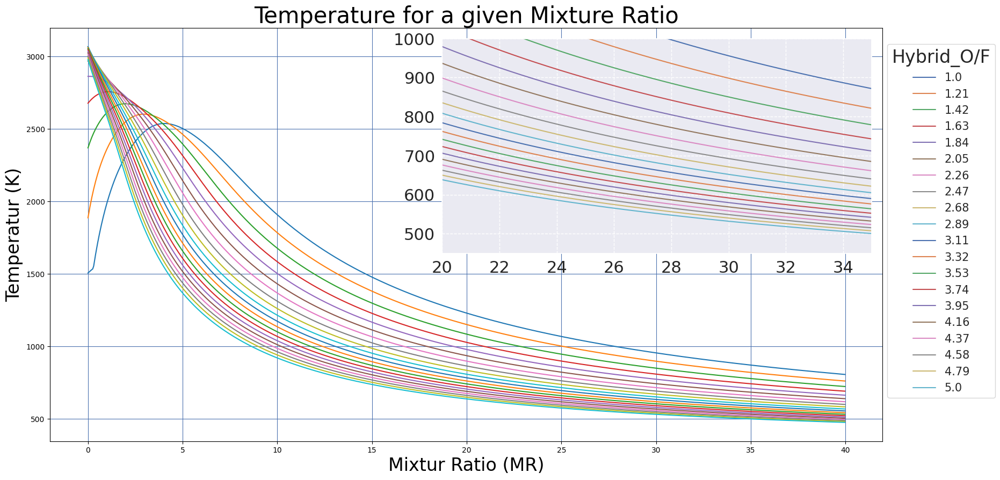

In [9]:
plt.figure(figsize = (20,10))
plt.plot(df)
plt.grid(color='b', linestyle='-')
plt.title('Temperature for a given Mixture Ratio', fontsize = 30)
plt.xlabel('Mixtur Ratio (MR)', fontsize = 24)
plt.ylabel('Temperatur (K)', fontsize =24)
sns.set(font_scale = 2)
ax2 = plt.axes([0.49, 0.46, .4, .4])
ax2.plot(df)
ax2.set_xlim([20,35])
ax2.set_ylim([450,1000])
plt.grid(color='w', linestyle='--')
plt.legend(O_F, bbox_to_anchor=(1.3, 1), loc='upper right', fontsize = 15, title = "Hybrid_O/F", facecolor = "w")
#plt.tight_layout()
plt.show()

## Mass flow rate required

Find the mass flow rate required

In [10]:
# Generate mass flow rate for fuel, oxidizer and together
m_ox =[i for i in np.linspace(30, 210, 20)]
m_f = [m_ox / O_F for m_ox, O_F in zip(m_ox, O_F)]
m_h = [m_ox + m_f for m_ox, m_f in zip(m_ox, m_f)]
# print(m_ox)
# print(m_f)
# print(m_h)

# convert mixture ratio list to numpy array
MR_Lst = np.array(MR_lst)
m_hy = np.array(m_h)

# Reshape mixture ratio and mass flow rate of hybrid arrays
MR_Lst = np.reshape(MR_Lst, (800, 1))
MR_Lst.shape
# print(MR_Lst)

m_hy = np.reshape(m_hy, (1,20))
m_hy.shape
# print(m_hy)

# Air flow rate for a given mixture ratio and hybrid flow rate
m_a = MR_Lst*m_hy
m_a

array([[6.00000000e-01, 7.20965637e-01, 8.34173462e-01, ...,
        2.32767180e+00, 2.42389847e+00, 2.52000000e+00],
       [3.60000000e+00, 4.32579382e+00, 5.00504077e+00, ...,
        1.39660308e+01, 1.45433908e+01, 1.51200000e+01],
       [6.60000000e+00, 7.93062201e+00, 9.17590808e+00, ...,
        2.56043898e+01, 2.66628832e+01, 2.77200000e+01],
       ...,
       [2.39160000e+03, 2.87376903e+03, 3.32501542e+03, ...,
        9.27809979e+03, 9.66165931e+03, 1.00447200e+04],
       [2.39460000e+03, 2.87737386e+03, 3.32918629e+03, ...,
        9.28973815e+03, 9.67377880e+03, 1.00573200e+04],
       [2.39760000e+03, 2.88097869e+03, 3.33335715e+03, ...,
        9.30137651e+03, 9.68589830e+03, 1.00699200e+04]])

In [11]:
df_ma = pd.DataFrame(data = m_a, index = MR_lst, columns = O_F)     # Create data frame for mass flow rate
#df_ma = df_ma.MultiIndex(m_h)
df_ma = df_ma.rename_axis(index='MR', columns="Hybrid_O/F")
df_ma

Hybrid_O/F,1.00,1.21,1.42,1.63,1.84,2.05,2.26,2.47,2.68,2.89,3.11,3.32,3.53,3.74,3.95,4.16,4.37,4.58,4.79,5.00
MR,,,,,,,,,,,,,,,,,,,,
0.01,0.6,0.720966,0.834173,0.942622,1.047941,1.151091,1.252678,1.353100,1.452632,1.551466,1.648452,1.746354,1.843880,1.941092,2.038041,2.134767,2.231302,2.327672,2.423898,2.52
0.06,3.6,4.325794,5.005041,5.655731,6.287643,6.906547,7.516069,8.118602,8.715789,9.308796,9.890709,10.478123,11.063277,11.646552,12.228248,12.808603,13.387812,13.966031,14.543391,15.12
0.11,6.6,7.930622,9.175908,10.368841,11.527346,12.662003,13.779460,14.884104,15.978947,17.066126,18.132967,19.209892,20.282675,21.352012,22.418454,23.482439,24.544321,25.604390,26.662883,27.72
0.16,9.6,11.535450,13.346775,15.081950,16.767048,18.417458,20.042850,21.649606,23.242105,24.823457,26.375224,27.941661,29.502072,31.057473,32.608661,34.156275,35.700831,37.242749,38.782376,40.32
0.21,12.6,15.140278,17.517643,19.795060,22.006751,24.172914,26.306241,28.415108,30.505263,32.580787,34.617482,36.673431,38.721470,40.762933,42.798867,44.830111,46.857341,48.881108,50.901868,52.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39.76,2385.6,2866.559374,3316.673684,3747.864643,4166.611442,4576.738383,4980.648347,5379.927040,5775.663158,6168.628956,6554.243222,6943.502854,7331.265007,7717.781931,8103.252232,8487.834413,8871.656510,9254.823075,9637.420327,10019.52
39.81,2388.6,2870.164202,3320.844552,3752.577753,4171.851144,4582.493838,4986.911737,5386.692542,5782.926316,6176.386287,6562.485480,6952.234623,7340.484404,7727.487391,8113.442438,8498.508249,8882.813019,9266.461434,9649.539820,10032.12
39.86,2391.6,2873.769030,3325.015419,3757.290862,4177.090847,4588.249294,4993.175128,5393.458044,5790.189474,6184.143617,6570.727737,6960.966392,7349.703802,7737.192851,8123.632645,8509.182085,8893.969529,9278.099793,9661.659312,10044.72


Mass flow rate of air plot

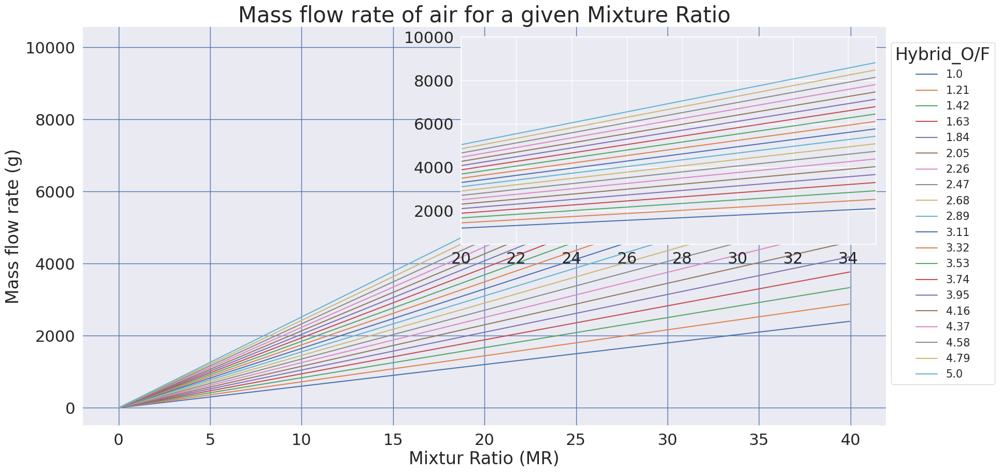

In [12]:
ax = plt.figure(figsize = (20,10))
ax1 = ax.subplots()
ax1.plot(df_ma)
plt.grid(color='b', linestyle='-')
plt.title('Mass flow rate of air for a given Mixture Ratio', fontsize = 30)
plt.xlabel('Mixtur Ratio (MR)', fontsize = 24)
plt.ylabel('Mass flow rate (g)', fontsize =24)
sns.set(font_scale = 2)
ax2 = plt.axes([0.49, 0.46, .4, .4])
ax2.plot(df_ma)
ax2.set_xlim([20,35])
ax2.set_ylim([450,10000])
plt.grid(color='w', linestyle='-')
plt.legend(O_F, bbox_to_anchor=(1.3, 1), loc='upper right', fontsize = 15, title = "Hybrid_O/F", facecolor = "w")
#plt.tight_layout()
cursor = Cursor(ax1, horizOn = True, vertOn = True, useblit = False)
plt.show()

## Analyzing various parameters of system

considering all important parameters in the evaluation of Hybrid

In [13]:
import numpy as np
import math
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import *
from rocketcea.cea_obj import CEA_Obj, add_new_fuel, add_new_oxidizer, add_new_propellant


card_str = """
   oxid Air    wt%=100.00
   h,cal=-28.2     t(k)=300

   """
add_new_oxidizer( 'oxy', card_str )
# Add fuel
T_C = []
lst1 = []
lst2 = []
O_F = []
Result = []

# Iterating for a range of oxidizer to fuel mixture
for o_f in np.linspace(1, 5, 20):
  m_f = 100 / (1 + o_f)
  m_ox = 100 - m_f
  lst1.append(m_ox)
  lst2.append(m_f)
  O_F.append(round(o_f, 2))

# Iterating fuel card for several Hybrid ratios
for i in range(len(lst1)):

          card_str = """
            fuel OXYGEN  O 2     wt%=""" + str(lst1[i]) + """
            h,cal= 12.9918 t(k)=300
            fuel WAX C 26 H 54    wt%=""" + str(lst2[i]) + """
            h,cal= -140439.7 t(k)=300

            """
          add_new_fuel( 'fuel', card_str )

          from rocketcea.cea_obj_w_units import CEA_Obj
          C = CEA_Obj(oxName='oxy', fuelName="fuel",isp_units='sec', cstar_units='m/s', pressure_units='Bar', temperature_units='K', sonic_velocity_units='m/s', enthalpy_units='BTU/lbm', density_units='kg/m^3', specific_heat_units='J/kg-K', viscosity_units='millipoise', thermal_cond_units='W/cm-degC', fac_CR=None, make_debug_prints=False)
          n = []
          e = []
          t = []
          result = []
          H_o_f = lst1[i]/lst2[i]
          def show_perf( Pc=10, eps=1, MR=1.0 ):

              IspVac, Cstar, Tc, MW, gamma = C.get_IvacCstrTc_ChmMwGam(Pc=Pc, MR=MR, eps=eps)          # Performance parameters
              molWtD, massFracD = C.get_SpeciesMassFractions(Pc=Pc, eps=eps, MR=MR)                    # Gives the set containing species mol weight and mass fraction
              s = list(massFracD.items())                                                            # Gives the list of massFrac of species
              for specie in s:                # iterating over each species

                oxy_spe = "*O2"

                if oxy_spe in specie:         # Considering only oxygen species
                  oxy_spe = specie

                else:
                  oxy_spe = [0,[0,0,0,0]]

              l = oxy_spe[0]                  # Oxygen string
              m_F_cc = oxy_spe[1][0]          # mass fraction of oxygen
                                              # Store the values in result for a given hybrid ratio and mixture ratio
              result.append([Pc, eps, round(MR, 2), round(H_o_f,2), round(IspVac, 2), round(Cstar, 2), round(Tc, 2), round(MW, 2), gamma, m_F_cc])

          Pc = 10
          eps = 1
          MR_lst = []
          for MR in [1.0 + i*0.1 for i in range(400)]:            # For every MR show_performance is called
            show_perf( Pc=Pc, eps=eps, MR=MR )
            MR_lst.append(MR)
          Result.append(result)                                   # For result to Result(contains all mixture ratios for each Hybrid ratio i.e for one loop of hybrid ratio)
                                                                  # Result [ result(hybrid_ratio1([[MR_1], [MR_2]]), hybrid_ratio2([[MR_1], [MR_2]])) ]
print('result', result)

MR_Lst = MR_lst
print('Result', Result)



result [[10, 1, 1.0, 5.0, 172.73, 1370.22, 2730.44, 29.49, 1.1531904056569735, 0.23102314502295032], [10, 1, 1.1, 5.0, 170.5, 1351.33, 2673.56, 29.55, 1.1597813498916645, 0.23075836896675447], [10, 1, 1.2, 5.0, 168.31, 1332.7, 2616.78, 29.59, 1.1667615976794032, 0.23077548023216515], [10, 1, 1.3, 5.0, 166.15, 1314.41, 2560.34, 29.61, 1.1739758187374374, 0.23099668583573543], [10, 1, 1.4, 5.0, 164.04, 1296.54, 2504.49, 29.63, 1.1812554700364726, 0.23135550172102576], [10, 1, 1.5, 5.0, 161.98, 1279.16, 2449.49, 29.63, 1.1884385020259887, 0.2317970771595365], [10, 1, 1.6, 5.0, 159.97, 1262.32, 2395.61, 29.63, 1.1953874758220817, 0.23227814490754897], [10, 1, 1.7, 5.0, 158.02, 1246.06, 2343.07, 29.63, 1.2020000482763697, 0.2327663722953316], [10, 1, 1.8, 5.0, 156.14, 1230.38, 2292.04, 29.62, 1.2082123621177994, 0.23323907834458915], [10, 1, 1.9, 5.0, 154.31, 1215.3, 2242.66, 29.61, 1.2139943851764559, 0.2336815925197932], [10, 1, 2.0, 5.0, 152.56, 1200.8, 2195.0, 29.6, 1.2193444902460497, 

In [14]:
import pandas as pd

# Result is a list of lists where each inner list represents a row of data
# Convert the Result list to a DataFrame
df = pd.DataFrame([item for sublist in Result for item in sublist], columns=['Pc(psia)', 'eps', 'MixtureRatio', 'H_o_f', 'IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'O2_MF'])

# Save the DataFrame to a CSV file
df.to_csv('result.csv', index=False)

In [15]:
df

,Pc(psia),eps,MixtureRatio,H_o_f,IspVac(sec),Cstar(m/sec),Tc(k),MolWt,gamma,O2_MF
0,10,1,1.0,1.0,174.51,1365.47,1989.00,20.09,1.280810,0.000000
1,10,1,1.1,1.0,174.70,1367.57,2034.55,20.53,1.276843,0.000000
2,10,1,1.2,1.0,174.86,1369.29,2077.05,20.94,1.273128,0.000000
3,10,1,1.3,1.0,174.98,1370.71,2116.80,21.34,1.269632,0.000000
4,10,1,1.4,1.0,175.07,1371.89,2154.07,21.72,1.266326,0.000000
...,...,...,...,...,...,...,...,...,...,...
7995,10,1,40.5,5.0,69.72,539.77,474.31,29.01,1.386055,0.232077
7996,10,1,40.6,5.0,69.69,539.54,473.90,29.01,1.386102,0.232076
7997,10,1,40.7,5.0,69.66,539.30,473.49,29.01,1.386149,0.232074
7998,10,1,40.8,5.0,69.63,539.06,473.08,29.01,1.386196,0.232072


In [16]:
# # For Short form data
# import pandas as pd

# # we have already calculated and stored the 'Result' list and 'O_F' list

# # Convert the 'Result' list to a pandas DataFrame
# columns = ['Pc(psia)', 'eps', 'MixtureRatio', 'H_o_f', 'IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'comp']
# df = pd.DataFrame([item for sublist in Result for item in sublist], columns=columns)

# # Convert 'H_o_f' column to float data type
# df['H_o_f'] = df['H_o_f'].astype(float)

# # Define the parameters for melting (columns to be unpivoted)
# parameters = ['IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'comp']

# # Melt the DataFrame to convert it to short-form data
# df_short = pd.melt(df, id_vars=['Pc(psia)', 'eps', 'MixtureRatio', 'H_o_f'], value_vars=parameters,
#                    var_name='Parameter', value_name='Value')

# # Print the short-form DataFrame
# print(df_short)
# # Save the DataFrame to a CSV file
# df_short.to_csv('result2.csv', index=False)


Plot the parameters for Hybrid and mixture ratio.

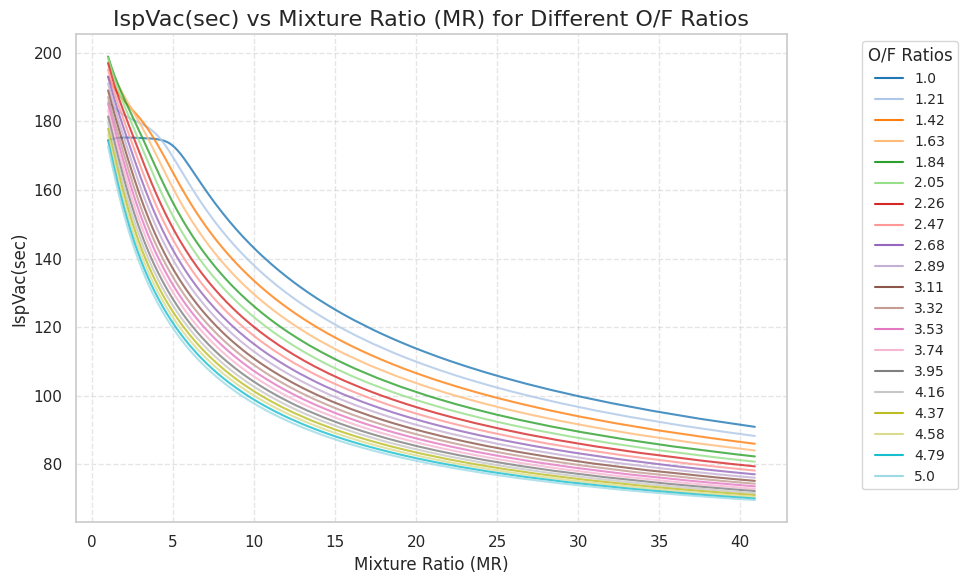

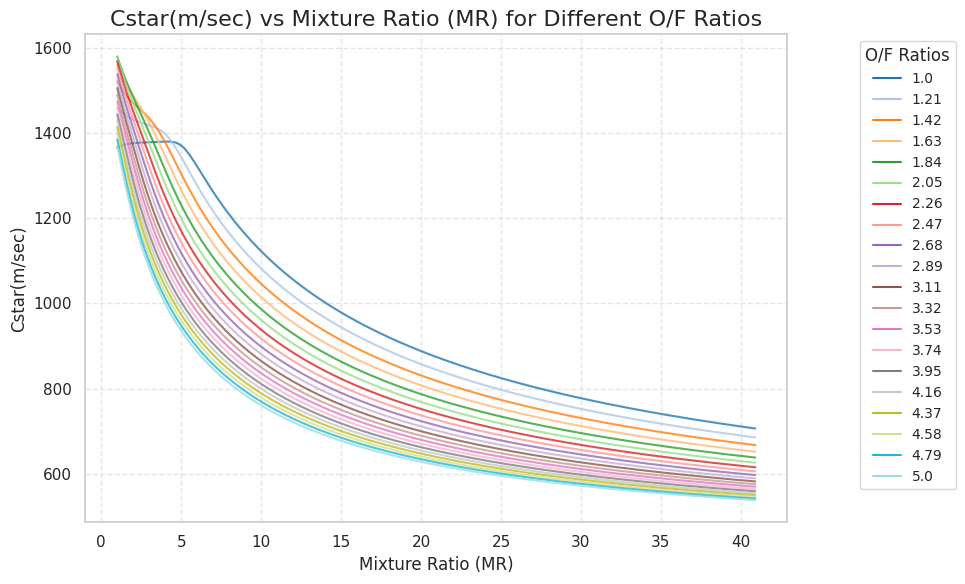

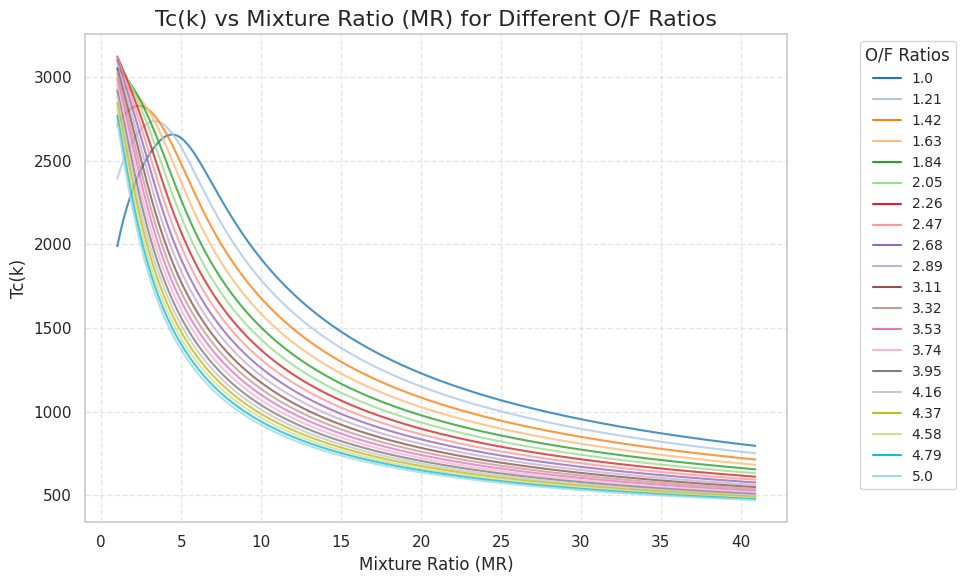

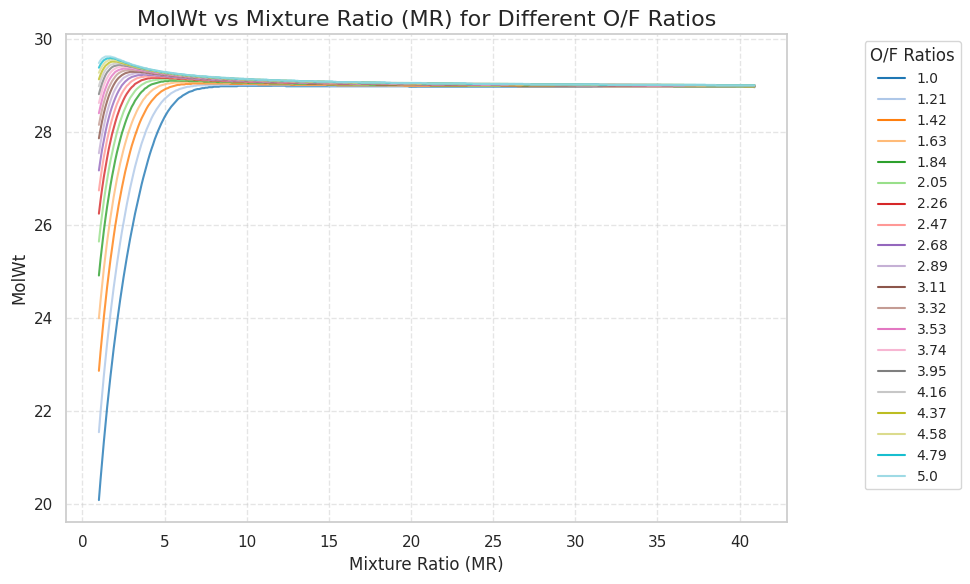

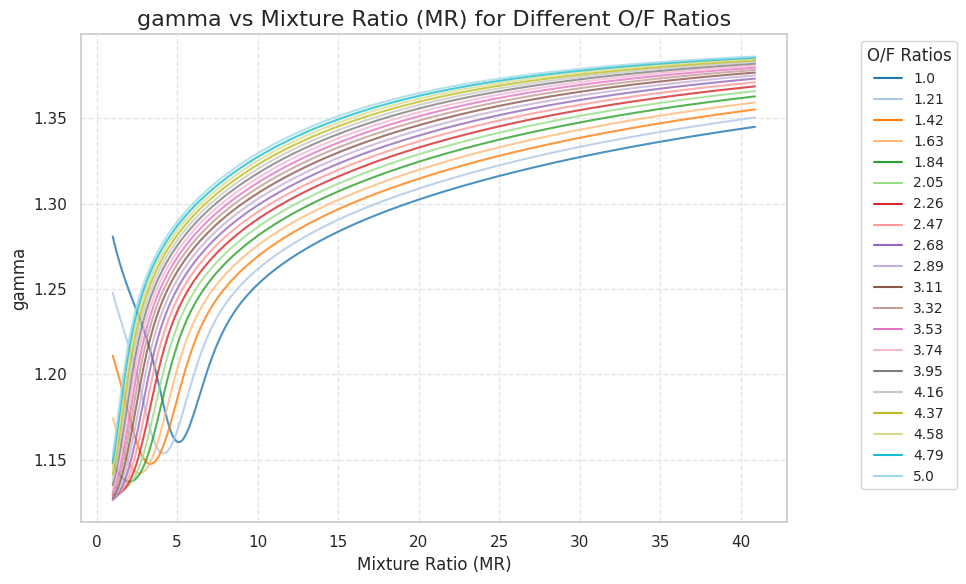

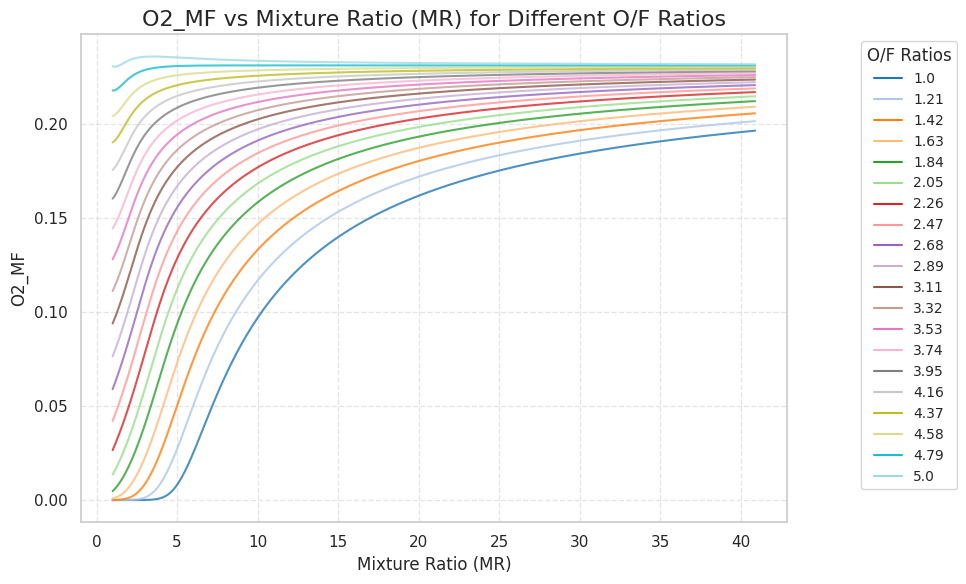

In [17]:
# Convert the 'Result' list to a pandas DataFrame
columns = ['Pc(psia)', 'eps', 'MixtureRatio', 'H_o_f', 'IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'O2_MF']
df = pd.DataFrame([item for sublist in Result for item in sublist], columns=columns)


# Convert 'H_o_f' column to string data type
df['H_o_f'] = df['H_o_f'].astype(str)

# Create a list of parameter names
parameters = ['IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'O2_MF']

# Set the style for the plots
sns.set(style='whitegrid')
sns.set_palette('tab20')       # 20 distinguishable colors

# Loop through each parameter and create the plots
for param in parameters:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='MixtureRatio', y=param, hue='H_o_f', data=df, markers=True, alpha=0.8)

    plt.title(f'{param} vs Mixture Ratio (MR) for Different O/F Ratios', fontsize=16)
    plt.xlabel('Mixture Ratio (MR)', fontsize=12)
    plt.ylabel(param, fontsize=12)
    plt.legend(title='O/F Ratios', loc='upper right', bbox_to_anchor=(1.25, 1), fontsize=10, title_fontsize=12)
    plt.grid(True, linestyle='dashed', alpha=0.5)
    plt.tight_layout()
    plt.show()




Plotting the above for a realative color style

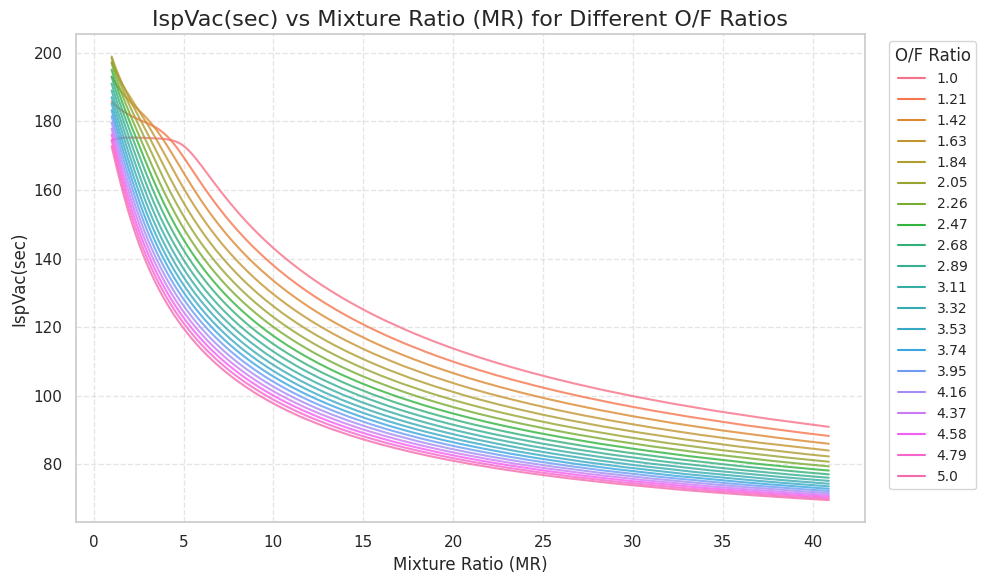

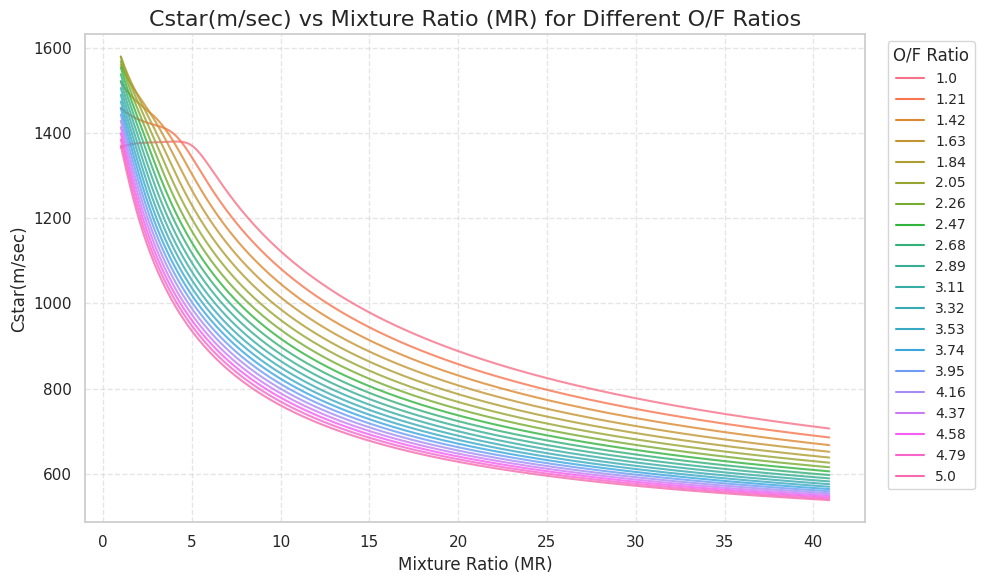

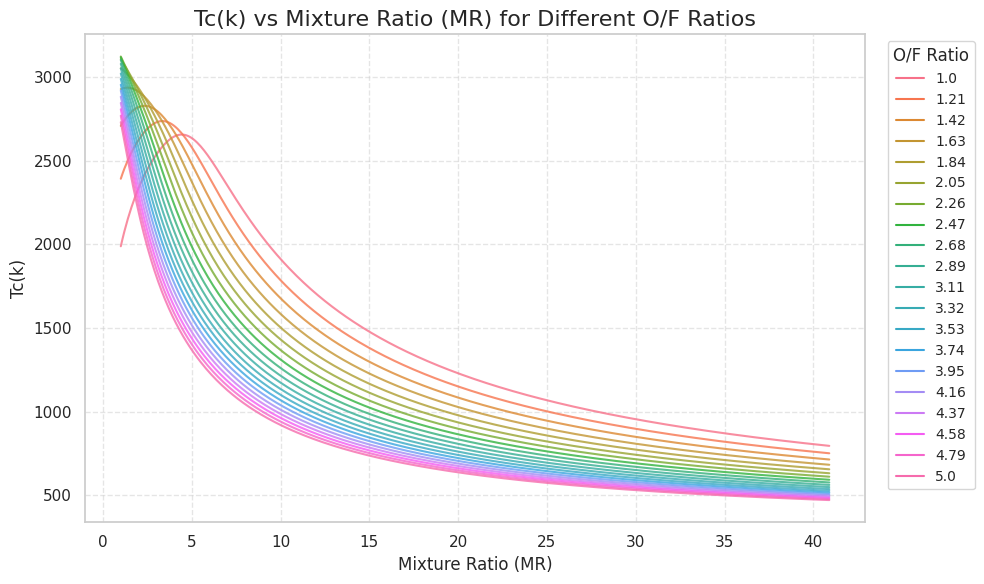

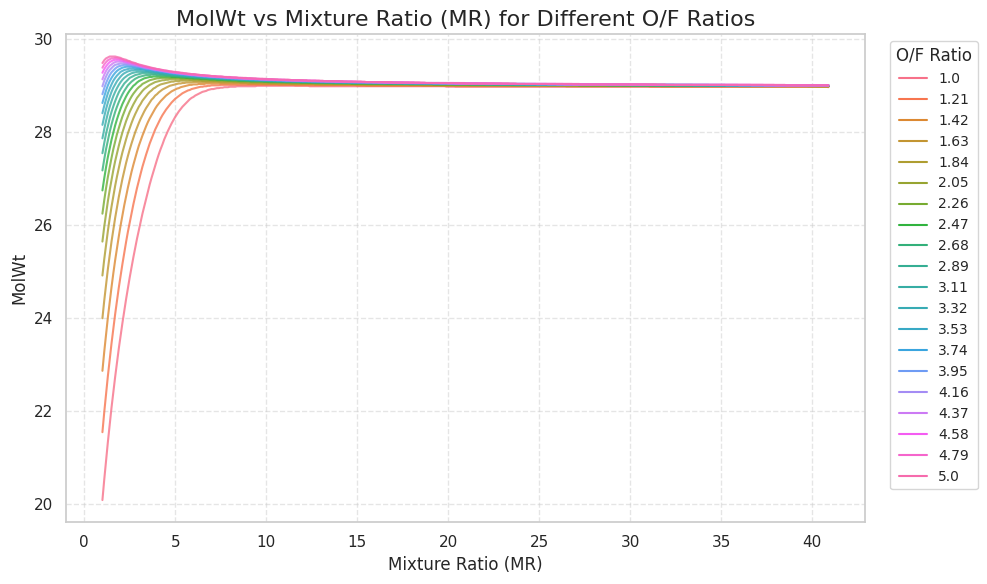

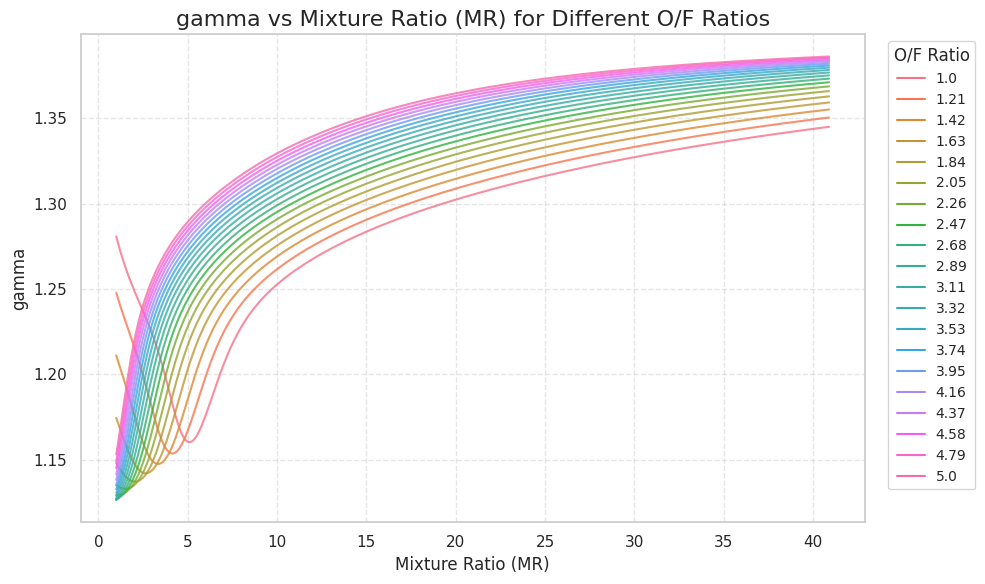

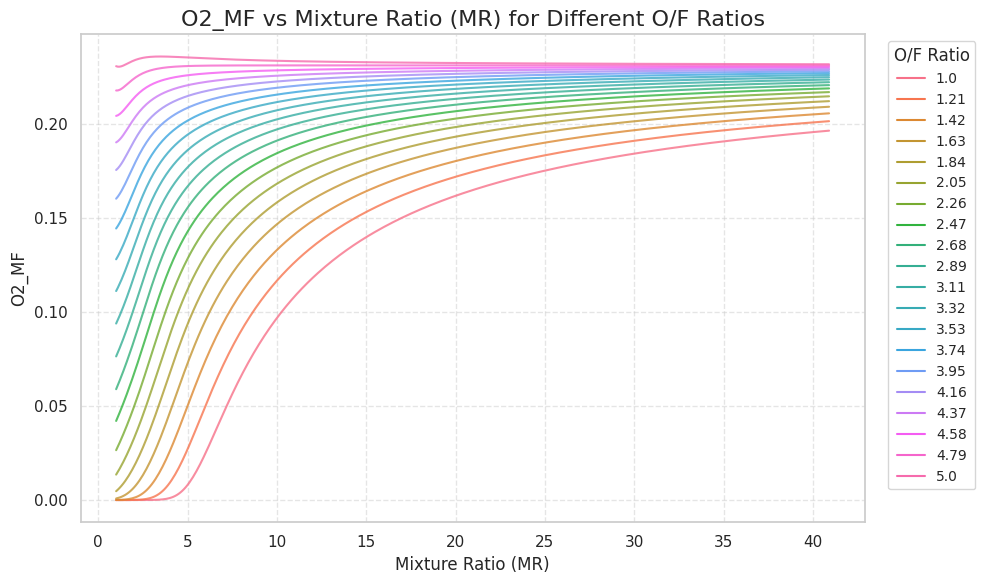

In [18]:
# Set the style for the plots
sns.set(style='whitegrid')

# Loop through each parameter and create the plots
for param in parameters:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='MixtureRatio', y=param, hue='H_o_f', data=df, markers=True, err_style=None, alpha=0.8)
    plt.title(f'{param} vs Mixture Ratio (MR) for Different O/F Ratios', fontsize=16)
    plt.xlabel('Mixture Ratio (MR)', fontsize=12)
    plt.ylabel(param, fontsize=12)
    plt.legend(title='O/F Ratio', loc='upper right', bbox_to_anchor=(1.15, 1), fontsize=10, title_fontsize=12)
    plt.grid(True, linestyle='dashed', alpha=0.5)
    plt.tight_layout()
    plt.show()


Creating more interactive plot using bokeh

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
from matplotlib.colors import rgb2hex
output_notebook()

# Convert the 'Result' list to a pandas DataFrame
columns = ['Pc(psia)', 'eps', 'MixtureRatio', 'H_o_f', 'IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'O2_MF']
df = pd.DataFrame([item for sublist in Result for item in sublist], columns=columns)

# Convert 'H_o_f' column to float data type
df['H_o_f'] = df['H_o_f'].astype(float)

# Create a list of parameter names
parameters = ['IspVac(sec)', 'Cstar(m/sec)', 'Tc(k)', 'MolWt', 'gamma', 'O2_MF']

# Set the style for the plots
sns.set(style='whitegrid')
sns.set_palette('tab20')

# Convert Seaborn's RGB color palette to Bokeh color representations
bokeh_palette = [rgb2hex(c) for c in sns.color_palette('tab20')]

# Loop through each parameter and create the interactive plots
for param in parameters:
    p = figure(width=1200, height=800, title=f'{param} vs Mixture Ratio (MR) for Different O/F Ratios',
               x_axis_label='Mixture Ratio (MR)', y_axis_label=param)
    # Center the title
    p.title.align = 'center'
    p.title.text_font_size = '16pt'

    unique_h_o_f = df['H_o_f'].unique()
    for o_f in unique_h_o_f:
        data = df[df['H_o_f'] == o_f]
        source = ColumnDataSource(data=dict(x=data['MixtureRatio'], y=data[param], H_o_f=data['H_o_f']))
        line = p.line('x', 'y', source=source, line_width=2, line_color=bokeh_palette[int(o_f * 10) % len(bokeh_palette)],
                      legend_label=f'O/F = {o_f:.2f}')
        p.add_tools(HoverTool(renderers=[line], tooltips=[('O/F', '@H_o_f'), ('Mixture Ratio', '@x'), (param, '@y')]))

    p.legend.title = 'O/F Ratios'
    p.legend.location = 'top_right'  # Change the legend location here
    p.legend.click_policy = 'hide'

    # Add grid lines, axes labels, and plot title
    p.grid.grid_line_color = 'lightgray'
    p.xaxis.axis_label_text_font_size = '14pt'
    p.yaxis.axis_label_text_font_size = '14pt'
    p.title.text_font_size = '16pt'

    show(p)


### More information on creating above plot

1. Import the necessary libraries:
   - `numpy`: For numerical operations.
   - `pandas`: For working with data in tabular form using DataFrames.
   - `seaborn`: For setting plot styles and accessing color palettes.
   - `bokeh.plotting`: For creating interactive plots.
   - `bokeh.models`: For defining plot elements and tools.
   - `bokeh.io`: For outputting Bokeh plots in Jupyter Notebook.
   - `matplotlib.colors`: For converting RGB colors to hex format.

2. Set the output mode to display Bokeh plots in the Jupyter Notebook using `output_notebook()`.

3. Assuming you have already calculated and stored the 'Result' list and 'O_F' list.

4. Convert the 'Result' list to a pandas DataFrame named `df` using a list comprehension. The DataFrame will have columns corresponding to the calculated parameters.

5. Convert the 'H_o_f' column to a string data type. This conversion ensures that we can use the 'H_o_f' values as labels for the legend in the Bokeh plot later.

6. Create a list `parameters` containing the parameter names for which you want to plot the data against the Mixture Ratio.

7. Set the style for the plots using Seaborn. Here, we set the style to 'whitegrid' and use the 'tab20' palette.

8. Convert Seaborn's RGB color palette to Bokeh color representations. The 'tab20' palette contains 20 colors. We use the `rgb2hex` function to convert each RGB color to a hex representation, creating the `bokeh_palette`.

9. Loop through each parameter in the `parameters` list.

10. For each parameter, create a Bokeh figure named `p` with the specified width, height, and title.

11. Get the unique O/F ratios from the 'H_o_f' column of the DataFrame.

12. Loop through each unique O/F ratio.

13. Filter the DataFrame to get the data corresponding to the current O/F ratio.

14. Create a Bokeh `ColumnDataSource` named `source` using the filtered data. The `ColumnDataSource` holds the data that will be used for plotting and displaying tooltips.

15. Create a line plot using the `line` function of the Bokeh figure. We pass the 'x' and 'y' data from the `source`, set the line width, and specify the line color using the `bokeh_palette`. We use the `legend_label` parameter to label each line with the corresponding O/F ratio.

16. Add a `HoverTool` to the figure. The `HoverTool` displays tooltips when the mouse cursor hovers over a data point. We specify the `renderers` and `tooltips` parameters to determine which lines will have tooltips and what information they will display.

17. Set the title and location for the legend of the plot. The legend will show the O/F ratios and allow the user to interactively hide/show lines by clicking on the legend items.

18. Show the Bokeh plot using the `show` function.

By following this process for each parameter in the `parameters` list, the code creates interactive line plots for each parameter with tooltips displaying data values and O/F ratios. Each O/F ratio will be displayed in a different color, and the legend allows you to interactively hide/show specific lines.

## Analysis on Mass Fraction of species

In [20]:
import numpy as np
import pandas as pd
from rocketcea.cea_obj import CEA_Obj, add_new_fuel, add_new_oxidizer

card_str = """
   oxid Air    wt%=100.00
   h,cal=-28.2     t(k)=300
   """
add_new_oxidizer('oxy', card_str)

# Add fuel
lst1 = []
lst2 = []
O_F = []
Result_mf = []
species_to_include = ['*CO2', '*N2', '*H2', '*CO', '*H', '*Ar', '*NO', 'NO2', 'HO2', '*O2', '*OH', 'H2O', '*O']

# Iterating for a range of oxidizer to fuel mixture
for o_f in np.linspace(1, 5, 20):
    m_f = 100 / (1 + o_f)
    m_ox = 100 - m_f
    lst1.append(m_ox)
    lst2.append(m_f)
    O_F.append(round(o_f, 2))

# Iterating fuel card for several Hybrid ratios
for i in range(len(lst1)):
    card_str = """
    fuel OXYGEN  O 2     wt%=""" + str(lst1[i]) + """
    h,cal= 12.9918 t(k)=300
    fuel WAX C 26 H 54    wt%=""" + str(lst2[i]) + """
    h,cal= -140439.7 t(k)=300
    """
    add_new_fuel('fuel', card_str)

    from rocketcea.cea_obj_w_units import CEA_Obj
    C = CEA_Obj(oxName='oxy', fuelName="fuel", isp_units='sec', cstar_units='m/s', pressure_units='Bar', temperature_units='K', sonic_velocity_units='m/s', enthalpy_units='BTU/lbm', density_units='kg/m^3', specific_heat_units='J/kg-K', viscosity_units='millipoise', thermal_cond_units='W/cm-degC', fac_CR=None, make_debug_prints=False)

    result_mf = []
    H_o_f = lst1[i] / lst2[i]

    def show_perf(Pc=10, eps=1, MR=1.0):
        molWtD, massFracD = C.get_SpeciesMassFractions(Pc=Pc, eps=eps, MR=MR)  # Gives the set containing species mol weight and mass fraction

        mass_fractions = [massFracD[specie][1] if specie in massFracD else 0.0 for specie in species_to_include]

        result_mf.append([Pc, eps, round(MR, 2), round(H_o_f, 2)] + mass_fractions)

    Pc = 10
    eps = 1
    MR_lst = []
    for MR in [1.0 + i * 0.1 for i in range(400)]:  # For every MR show_performance is called
        show_perf(Pc=Pc, eps=eps, MR=MR)
        MR_lst.append(MR)
    Result_mf.append(result_mf)

# After the loop, convert the 'Result' list to a DataFrame
df_columns = ['Pc(psia)', 'eps', 'MixtureRatio', 'H_o_f'] + species_to_include
res = [i for lst in Result_mf for i in lst]
df_MF = pd.DataFrame(res, columns=df_columns)

df_MF

,Pc(psia),eps,MixtureRatio,H_o_f,*CO2,*N2,*H2,*CO,*H,*Ar,*NO,NO2,HO2,*O2,*OH,H2O,*O
0,10,1,1.0,1.0,0.046188,0.377575,0.028849,0.467234,0.000013,0.006458,0.0,0.0,0.0,0.000000,0.000007,0.073650,0.0
1,10,1,1.1,1.0,0.050059,0.395558,0.026360,0.441137,0.000017,0.006766,0.0,0.0,0.0,0.000000,0.000011,0.080069,0.0
2,10,1,1.2,1.0,0.053772,0.411906,0.024106,0.417289,0.000021,0.007045,0.0,0.0,0.0,0.000000,0.000018,0.085823,0.0
3,10,1,1.3,1.0,0.057386,0.426832,0.022057,0.395373,0.000025,0.007300,0.0,0.0,0.0,0.000000,0.000027,0.090982,0.0
4,10,1,1.4,1.0,0.060947,0.440514,0.020191,0.375124,0.000030,0.007534,0.0,0.0,0.0,0.000000,0.000039,0.095605,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,10,1,40.5,5.0,0.013004,0.736986,0.000000,0.000000,0.000000,0.012605,0.0,0.0,0.0,0.232077,0.000000,0.005327,0.0
7996,10,1,40.6,5.0,0.012974,0.737030,0.000000,0.000000,0.000000,0.012606,0.0,0.0,0.0,0.232076,0.000000,0.005314,0.0
7997,10,1,40.7,5.0,0.012944,0.737074,0.000000,0.000000,0.000000,0.012606,0.0,0.0,0.0,0.232074,0.000000,0.005301,0.0
7998,10,1,40.8,5.0,0.012915,0.737117,0.000000,0.000000,0.000000,0.012607,0.0,0.0,0.0,0.232072,0.000000,0.005289,0.0


In [21]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool
import seaborn as sns

species_to_include = ['*CO2', '*N2', '*H2', '*CO', '*H', '*Ar', '*NO', 'NO2', 'HO2', '*O2', '*OH', 'H2O', '*O']

# Set the style for the plots
sns.set(style='whitegrid')
sns.set_palette('tab20')  # 20 distinguishable colors

# Convert Seaborn's RGB color palette to Bokeh color representations
bokeh_palette = [rgb2hex(c) for c in sns.color_palette('tab20')]

# Loop through each species and create individual plots
for species in species_to_include:
    # Create the Bokeh figure
    p = figure(width=1200, height=800, title=f"{species} vs Mixture Ratio (MR) for Different O/F Ratios",
               x_axis_label="Mixture Ratio (MR)", y_axis_label=f"{species} Mass Fraction")

    # Center the title
    p.title.align = 'center'
    p.title.text_font_size = '16pt'

    # Loop through each unique H_o_f value and add lines to the plot
    unique_h_o_f = df_MF['H_o_f'].unique()
    for o_f in unique_h_o_f:
        data = df_MF[df_MF['H_o_f'] == o_f]
        source = ColumnDataSource(data=dict(x=data['MixtureRatio'], y=data[species], H_o_f=data['H_o_f']))
        line = p.line('x', 'y', source=source, line_width=2, line_color=bokeh_palette[int(o_f * 10) % len(bokeh_palette)],
                      legend_label=f'O/F = {o_f:.2f}')
        p.add_tools(HoverTool(renderers=[line], tooltips=[('O/F', '@H_o_f'), ('Mixture Ratio', '@x'), (species, '@y')]))



    p.legend.title = 'O/F Ratios'
    p.legend.location = 'top_right'
    p.legend.click_policy = 'hide'

    # Add grid lines, axes labels, and plot title
    p.grid.grid_line_color = 'lightgray'
    p.xaxis.axis_label_text_font_size = '14pt'
    p.yaxis.axis_label_text_font_size = '14pt'
    p.title.text_font_size = '16pt'

    # Show the plot
    output_notebook()
    show(p)


## 3D plot for Mixture Ratio, O2 Mass Fraction, and Temperature for Different Hybrid O/F Ratios

In [22]:
!pip install plotly

In [23]:
import pandas as pd
import plotly.graph_objects as go


# Create the 3D scatter plot with thicker lines
fig = go.Figure(data=go.Scatter3d(
    x=df['MixtureRatio'],
    y=df['O2_MF'],
    z=df['Tc(k)'],
    mode='markers',
    marker=dict(
        size=1.5,  # Increase the marker size for thicker lines
        color=df['H_o_f'],  # Use the O/F ratio as the color scale
        colorscale='Viridis',  # Choose a color scale
        colorbar=dict(title='O/F Ratio', thickness=20, xanchor='left', x=-0.1),
        opacity=0.8,  # Adjust the marker opacity for better visibility
    )
))

# Set axis labels and title
fig.update_layout(scene=dict(
    xaxis_title='Mixture Ratio',
    yaxis_title='O2 Mass Fraction',
    zaxis_title='Temperature (K)',
), title='3D Scatter Plot: Mixture Ratio, O2 Mass Fraction, and Temperature for Different O/F Ratios')

# Add hover text to display additional information on each data point
hover_text = (
    "Mixture Ratio: %{x:.2f}<br>"
    "O2 Mass Fraction: %{y:.4f}<br>"
    "Temperature (K): %{z:.2f}<br>"
    "O/F Ratio: %{marker.color:.2f}"
)
fig.update_traces(text=hover_text, hoverinfo='text')

# Customize the layout and interaction
fig.update_layout(
    scene=dict(
        aspectmode='cube',  # Use a cube aspect ratio for a more balanced view
    ),
    scene_camera=dict(
        eye=dict(x=1.2, y=1.2, z=0.8),  # Adjust the initial camera view
    ),
    scene_dragmode='orbit',  # Allow users to orbit the plot
    hoverlabel=dict(bgcolor='white', font_size=12),  # Set the hover label style
    height=700,  # Set the height of the plot (increase from the default)
    width=1000,   # Set the width of the plot (decrease from the default)
)

# Show the 3D scatter plot
fig.show()


# Conclusion
* In this notebook, we performed a comprehensive chemical equilibrium analysis for a hybrid ramjet propulsion system. By using the "rocketcea" library and various Python tools, we calculated important performance parameters such as specific impulse, combustion temperature, and mass fraction of species. The visualizations helped us understand the relationships between different parameters and their variations with mixture ratios and chamber pressures for a given hybrid ratio.

# Key Findings:

* The specific impulse increased with higher mixture ratios, indicating improved propellant efficiency.
* Combustion temperature exhibited a non-linear relationship with mixture ratios, with an optimal value for efficient combustion.
* Mass fraction of species are moving twoards saturation as the oxygen percent increases in the hybrid also with the air.
* The CSV files generated during the analysis allow for further in-depth investigations and comparisons with other propulsion systems.

Overall, this analysis provides valuable insights into the performance characteristics of the hybrid ramjet system, helping us make informed decisions regarding the system's design and operational parameters.

# Additional Resources
* For further exploration and understanding of the topics covered in this notebook, you may find the following resources helpful:

* rocketcea Documentation: [Link to the rocketcea library documentation](https://rocketcea.readthedocs.io/en/latest/), providing detailed information about the library's functions and capabilities.

* Bokeh Documentation: [Link to the Bokeh library documentation](https://docs.bokeh.org/en/latest/index.html), offering guidance on creating interactive visualizations using Bokeh.

* Chemical Equilibrium Analysis: [Additional reading](https://cearun.grc.nasa.gov/intro.html) on chemical equilibrium and its applications in propulsion systems.

* Ramjet and Hybrid Propulsion: Deepen your knowledge of ramjet engines and hybrid propulsion technologies to understand their significance in the aerospace industry.

Feel free to explore these resources to expand your understanding of the subject matter.